### History of Philosophy - What are they talking about?

Import the tools we will use in the project.

In [41]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [42]:
data = pd.read_csv("D:/5243/philosophy_data.csv")
data.head()

,title,author,school,sentence_spacy,sentence_str,original_publication_date,corpus_edition_date,sentence_length,sentence_lowered,tokenized_txt,lemmatized_str
0,Plato - Complete Works,Plato,plato,"What's new, Socrates, to make you leave your ...","What's new, Socrates, to make you leave your ...",-350,1997,125,"what's new, socrates, to make you leave your ...","['what', 'new', 'socrates', 'to', 'make', 'you...","what be new , Socrates , to make -PRON- lea..."
1,Plato - Complete Works,Plato,plato,Surely you are not prosecuting anyone before t...,Surely you are not prosecuting anyone before t...,-350,1997,69,surely you are not prosecuting anyone before t...,"['surely', 'you', 'are', 'not', 'prosecuting',...",surely -PRON- be not prosecute anyone before ...
2,Plato - Complete Works,Plato,plato,The Athenians do not call this a prosecution b...,The Athenians do not call this a prosecution b...,-350,1997,74,the athenians do not call this a prosecution b...,"['the', 'athenians', 'do', 'not', 'call', 'thi...",the Athenians do not call this a prosecution ...
3,Plato - Complete Works,Plato,plato,What is this you say?,What is this you say?,-350,1997,21,what is this you say?,"['what', 'is', 'this', 'you', 'say']",what be this -PRON- say ?
4,Plato - Complete Works,Plato,plato,"Someone must have indicted you, for you are no...","Someone must have indicted you, for you are no...",-350,1997,101,"someone must have indicted you, for you are no...","['someone', 'must', 'have', 'indicted', 'you',...","someone must have indict -PRON- , for -PRON- ..."


# Part I. EDA 

First, we can see that data is made up of some numeric data and some non-numeric data. Let's start with the most intuitive numeric data -- sentence length. 

count    360808.000000
mean        150.790964
std         104.822072
min          20.000000
25%          75.000000
50%         127.000000
75%         199.000000
max        2649.000000
Name: sentence_length, dtype: float64


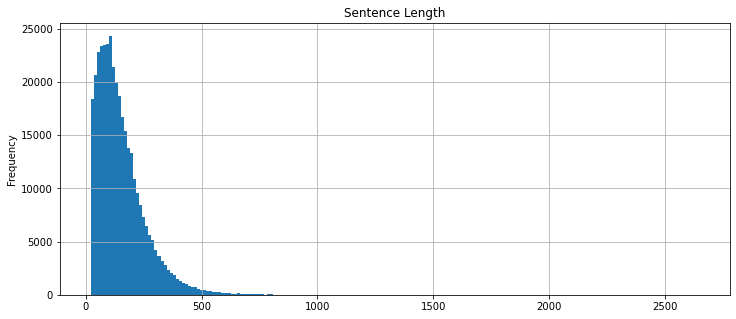

In [6]:
# sentence length
print(data.sentence_length.describe())

plt.figure(figsize=(12,5))
data.sentence_length.plot(kind='hist', bins=200)
plt.title('Sentence Length')
plt.grid()
plt.show()


From the table and images above we can see a summary description of sentence length for the entire dataset. The average sentence length is around 150.
Next, let's take a look at the distribution of sentence length in different titles, authors and schools.

In [4]:
schools = data.school.unique().tolist()
print(schools)

['plato', 'aristotle', 'empiricism', 'rationalism', 'analytic', 'continental', 'phenomenology', 'german_idealism', 'communism', 'capitalism', 'stoicism', 'nietzsche', 'feminism']


In [28]:
title_grouped = data.groupby("title")
title_grouped["sentence_length"].mean()

title
A General Theory Of Employment, Interest, And Money        196.654060
A Treatise Concerning The Principles Of Human Knowledge    184.724038
A Treatise Of Human Nature                                 183.008372
Anti-Oedipus                                               165.508459
Aristotle - Complete Works                                 153.224953
Being And Time                                             126.468313
Beyond Good And Evil                                       188.077125
Capital                                                    142.971837
Critique Of Judgement                                      211.984776
Critique Of Practical Reason                               175.376427
Critique Of Pure Reason                                    197.857200
Dialogues Concerning Natural Religion                      164.505138
Difference And Repetition                                  161.578911
Discourse On Method                                        375.602941
Ecce Homo     

In [25]:
author_grouped = data.groupby("author")
author_grouped["sentence_length"].mean()

author
Aristotle          153.224953
Beauvoir           148.790351
Berkeley           139.653987
Davis              139.671134
Deleuze            163.671850
Derrida            143.431239
Descartes          247.381625
Epictetus          118.430341
Fichte             151.964582
Foucault           189.637467
Hegel              175.720088
Heidegger          118.541965
Hume               180.192372
Husserl            185.473703
Kant               198.159400
Keynes             196.654060
Kripke             119.025082
Leibniz            157.085140
Lenin              181.423137
Lewis              109.717607
Locke              200.395836
Malebranche        164.434023
Marcus Aurelius    139.776221
Marx               143.253466
Merleau-Ponty      170.934009
Moore              167.254907
Nietzsche          116.599867
Plato              114.938018
Popper             139.545105
Quine              121.643429
Ricardo            186.252751
Russell            146.296669
Smith              185.277944
Spi

In [27]:
school_grouped = data.groupby("school")
school_grouped["sentence_length"].mean()

school
analytic           119.025205
aristotle          153.224953
capitalism         187.576289
communism          152.752311
continental        171.792060
empiricism         183.638051
feminism           153.083928
german_idealism    180.251329
nietzsche          116.599867
phenomenology      145.913345
plato              114.938018
rationalism        163.958996
stoicism           137.056410
Name: sentence_length, dtype: float64

count    360808.000000
mean        150.790964
std         104.822072
min          20.000000
25%          75.000000
50%         127.000000
75%         199.000000
max        2649.000000
Name: sentence_length, dtype: float64


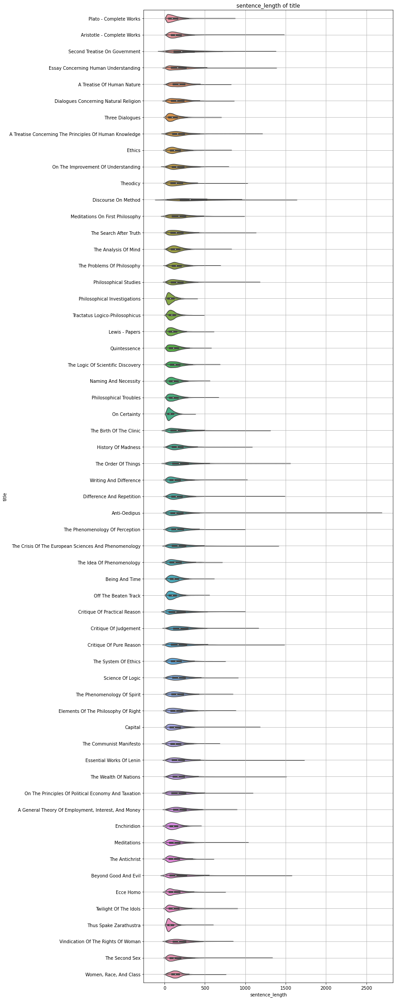

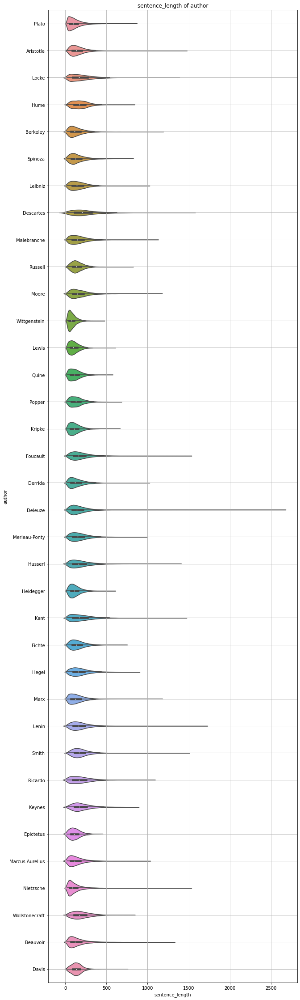

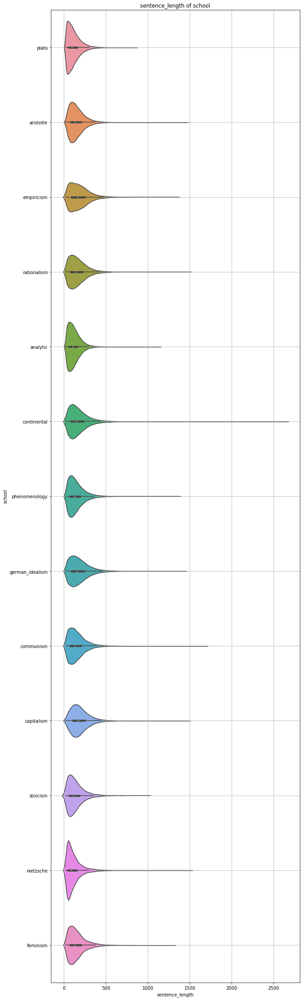

In [20]:
# plot sentence length split by title, author and school, respectively.
category = ['title', 'author', 'school']

for f in category:
    plt.figure(figsize=(10,40))
    sns.violinplot(x = "sentence_length", y=f, data=data)
    plt.title(f"sentence_length of {f}")
    plt.grid()

We can see the average sentence length among different titles from the table, the lowest one is On Certainty (79.38), and the highest one is Discourse On Method (375.60).
And among different authors, the average sentence length of Wittgenstein's works is about 84.88, which is the lowest, and Descartes's work have the highest average sentence length, which is about 247.38.
And for different schools, Plato has the lowest average sentence length at 114.94, while capitalism has the highest at 187.58.
We can also get a more intuitive recognize from the violinplot.

#### Another question is that whether every author have his own prefered sentence length when writing, in other words, do different books by the same author share similar sentence length?

Take Wittgenstein for example, the sentence length of his works Philosophical Investigations and On Certainty are 83.577252 and 79.377520, respectively, which are similar. So there is a good chance that authors have their own prefered sentence lengths when writing.

# Part Ⅱ. Wordcloud of different schools

School =  PLATO :


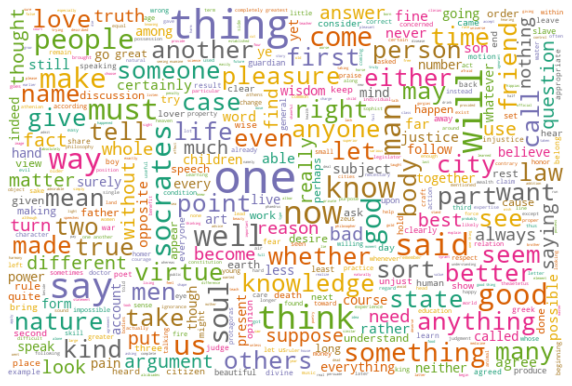

School =  ARISTOTLE :


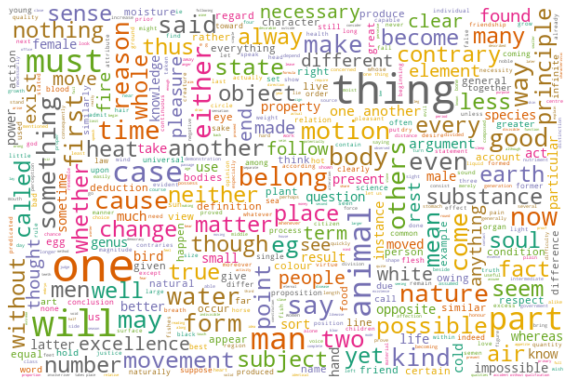

School =  EMPIRICISM :


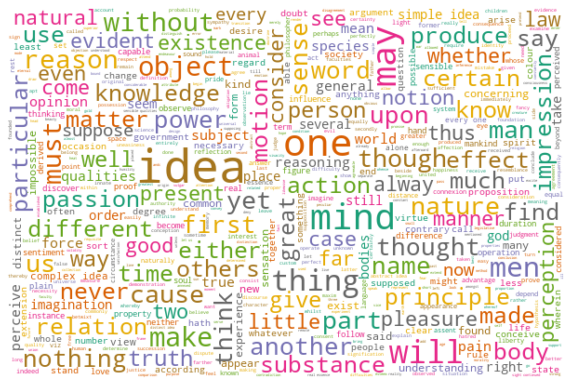

School =  RATIONALISM :


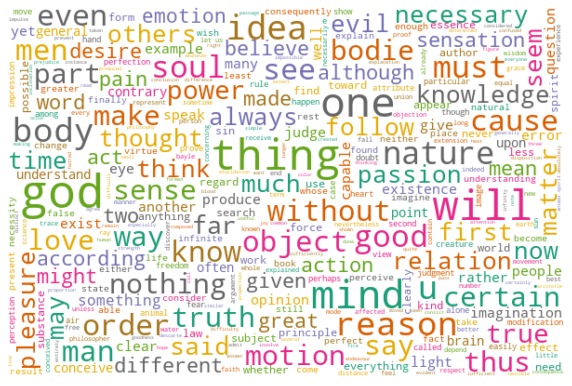

School =  ANALYTIC :


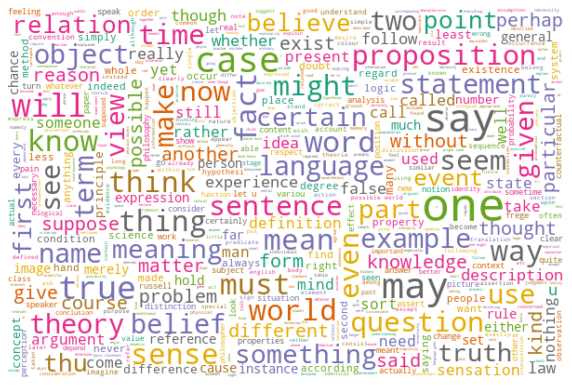

School =  CONTINENTAL :


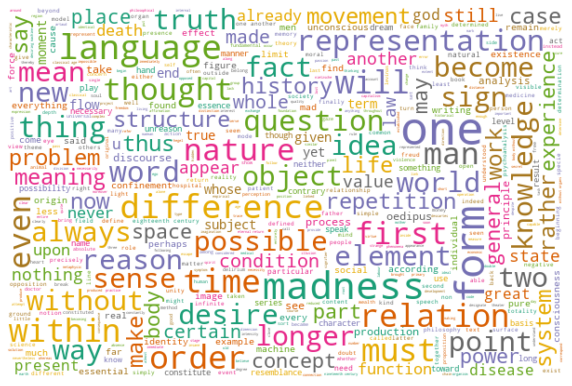

School =  PHENOMENOLOGY :


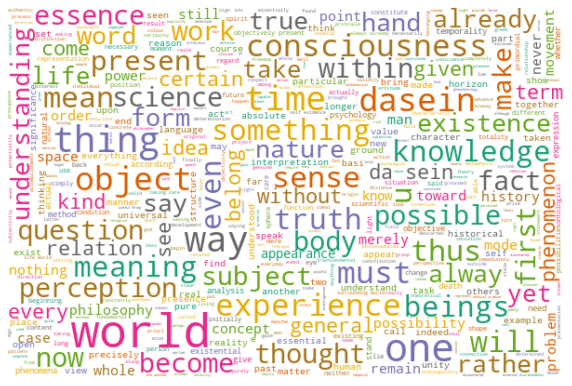

School =  GERMAN_IDEALISM :


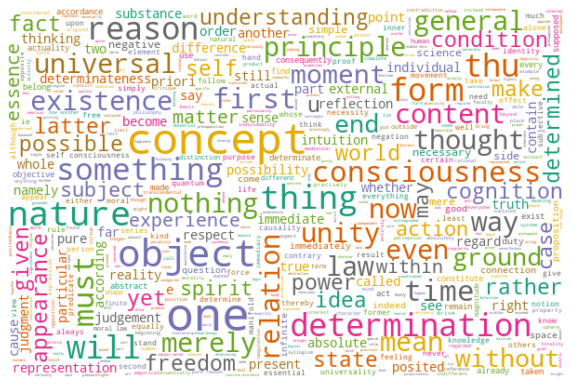

School =  COMMUNISM :


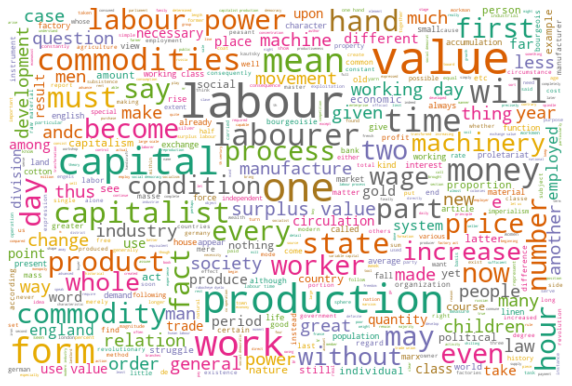

School =  CAPITALISM :


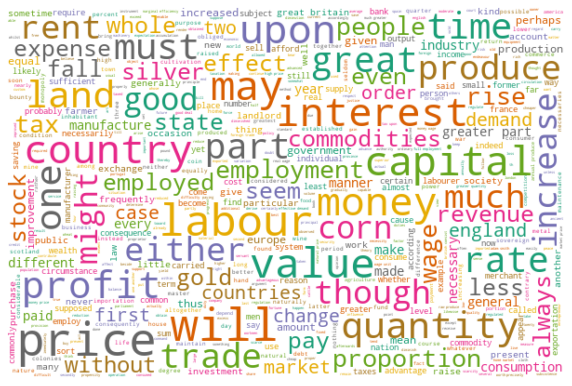

School =  STOICISM :


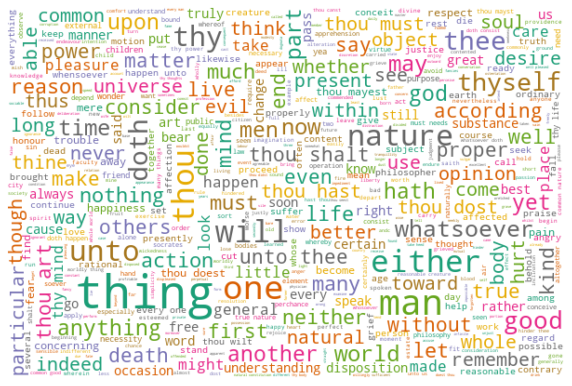

School =  NIETZSCHE :


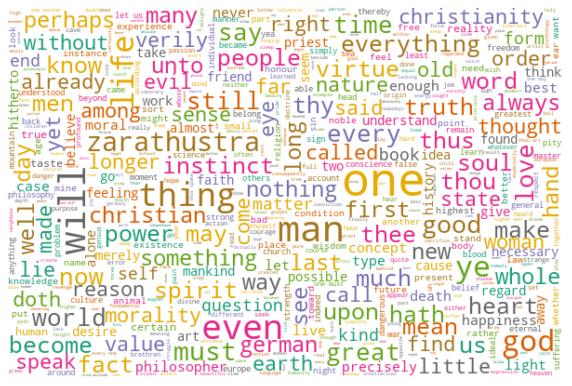

School =  FEMINISM :


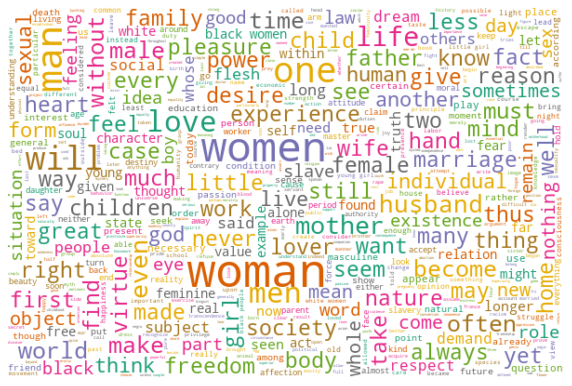

In [31]:
stopwords = set(STOPWORDS)

for sc in schools:
    data_temp = data[data.school==sc]  
    print('School = ', sc.upper(), ':')   
    # render wordcloud
    text = " ".join(txt for txt in data_temp.sentence_lowered)
    wordcloud = WordCloud(stopwords=stopwords, max_font_size=50, max_words=500,
                          width = 600, height = 400,colormap="Dark2",
                          background_color="white").generate(text)
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()


We can see that the pattern of wordclouds are different from school to school. For example, for schools named after people like Plato, Aristotle and Nietzsche, their high-frequency words are mostly common words like "will", "one", "thing", "must", "question". On the other hand, for schools named after the main feature of the school, their high-frequency words are more unique and we can actually read the idea of the school. This could be due to that the three schools have only one author respectively, so the plot can only show the writing pattern of the author rather than their idea. Therefore, wordcloud for the three authors are not that applicable and we should focus more on the other schools. 

School =  EMPIRICISM :


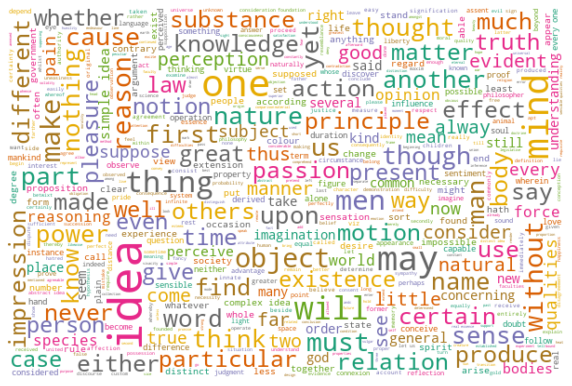

School =  RATIONALISM :


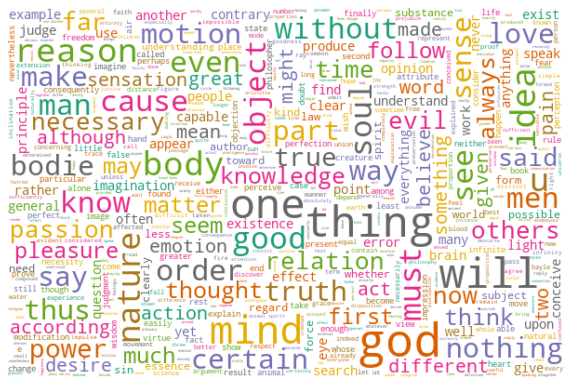

In [53]:
stopwords = set(STOPWORDS)
school_1 = ["empiricism", "rationalism"]

for sc in school_1:
    data_temp_1 = data[data.school==sc]  
    print('School = ', sc.upper(), ':')   
    # render wordcloud
    text = " ".join(txt for txt in data_temp_1.sentence_lowered)
    wordcloud = WordCloud(stopwords=stopwords, max_font_size=50, max_words=500,
                          width = 600, height = 400,colormap="Dark2",
                          background_color="white").generate(text)
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

Now we can have a closer look at the other schools and try to read their ideas from the wordclouds. For example, for empiricism we can see that their high frequency words including "impression", "idea", "sense", "action", "passion" and "mind". Although I have never read their books, I can still infer that their their behavior guidance may be more focus on personal experience. On the contrary, from the following plot of rationalism of which the high frequency words are "thing", "nature", "object", "certain", "truth", it clearly shows that the school focuses more on the real facts and theory that are more objective. From the word clouds of the two school, we can already know the main theory and idea of the schools without even have to read their books.

School =  CAPITALISM :


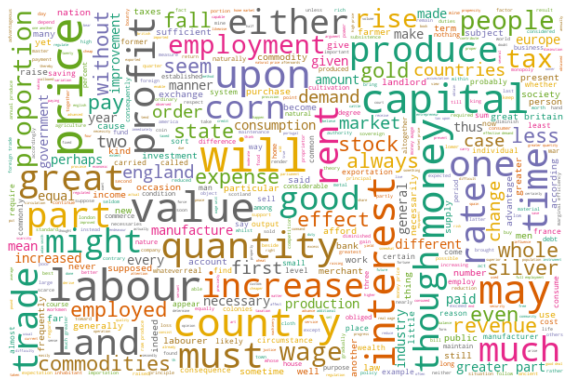

School =  COMMUNISM :


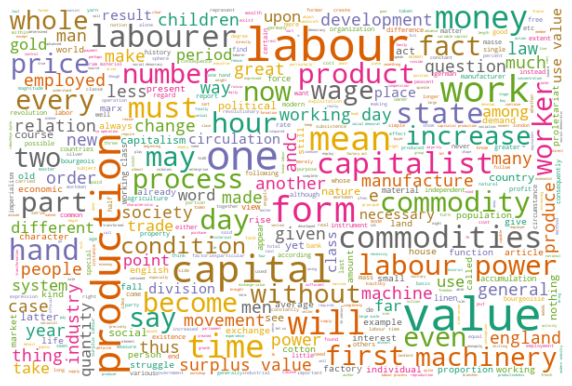

In [54]:
stopwords = set(STOPWORDS)
school_2 = ["capitalism", "communism"]

for sc in school_2:
    data_temp_2 = data[data.school==sc]  
    print('School = ', sc.upper(), ':')   
    # render wordcloud
    text = " ".join(txt for txt in data_temp_2.sentence_lowered)
    wordcloud = WordCloud(stopwords=stopwords, max_font_size=50, max_words=500,
                          width = 600, height = 400,colormap="Dark2",
                          background_color="white").generate(text)
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

For capitalism we can see that their high frequency words including "price", "capital", "value", "money", "labour" and "produce". Similarly, from the following plot of rationalism of which the high frequency words are "labour", "production", "value", "capital". It clearly shows that both the school focus on topic about the relationships between capital and human.

School =  PHENOMENOLOGY :


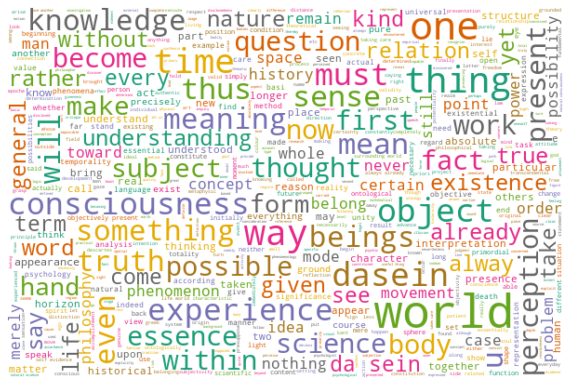

School =  ANALYTIC :


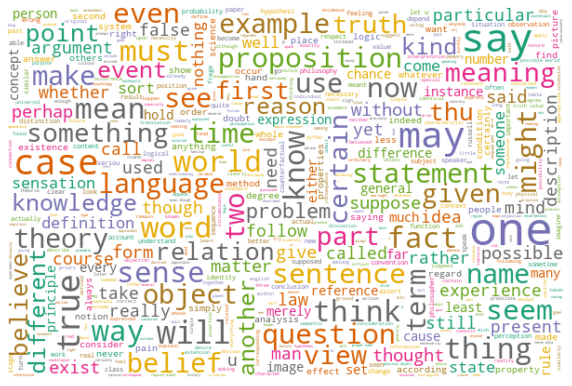

In [56]:
stopwords = set(STOPWORDS)
school_3 = ["phenomenology", "analytic"]

for sc in school_3:
    data_temp_3 = data[data.school==sc]  
    print('School = ', sc.upper(), ':')   
    # render wordcloud
    text = " ".join(txt for txt in data_temp_3.sentence_lowered)
    wordcloud = WordCloud(stopwords=stopwords, max_font_size=50, max_words=500,
                          width = 600, height = 400,colormap="Dark2",
                          background_color="white").generate(text)
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

For phenomenology we can see that their high frequency words including "consciousness", "meaning", "experience", "thought", which shows that the school describes things or object using their actual feelings and experience. From the word clouds of the two school. On the contrary, from the following plot of Analytic of which the high frequency words are "knowledge", "meaning", "object", "statement", "case", "certain", "theory", it clearly shows that the school focuses more on the real facts and theory that are more objective and use logical analysis to recognize things.

# Part Ⅲ. Do different authors from the same school share similar topics(frequently used words)? For example, the school of "communism".

Author =  SMITH :


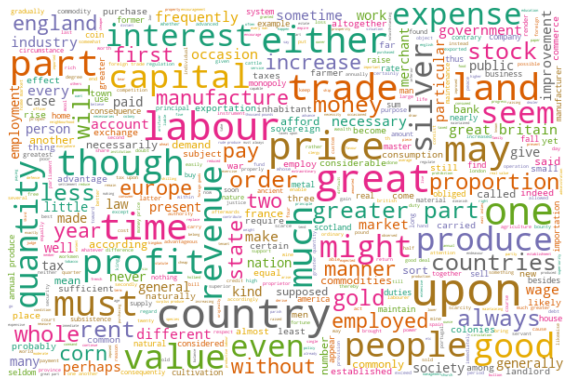

Author =  KEYNES :


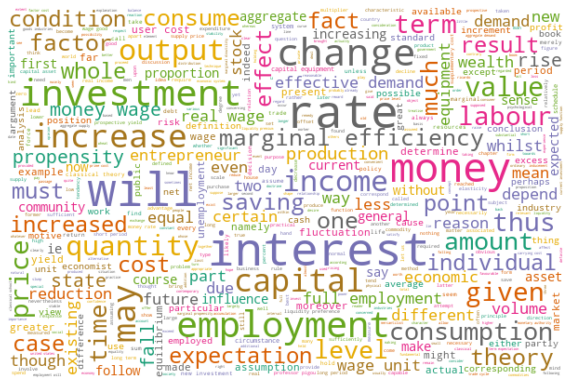

Author =  RICARDO :


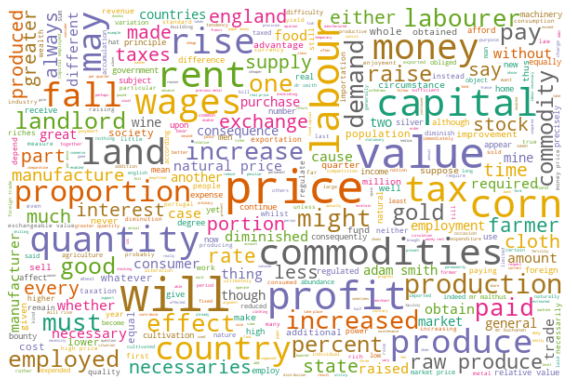

In [51]:
stopwords = set(STOPWORDS)
author = ["Smith", "Keynes", "Ricardo"]

for au in author:
    data_temp2 = data[data.author == au]  
    print('Author = ', au.upper(), ':')   
    # render wordcloud
    text = " ".join(txt for txt in data_temp2.sentence_lowered)
    wordcloud = WordCloud(stopwords=stopwords, max_font_size=50, max_words=500,
                          width = 600, height = 400, colormap="Dark2",
                          background_color="white").generate(text)
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

Smith's most frequently used words are "price", "labour", "trade", "country", etc. Keynes's frequently used words are "interest", "employment", "money", "investment", etc. Ricardo's frequently used words are "price", "profit", "value", "commodities".
We can see that although there's a little bit difference, the topics of the three authors' works are similar, they all talk about "labor", "price", "commodity" and so on, which is also consistent with the school(capitalism) to which they belong.

Author =  MERLEAU-PONTY :


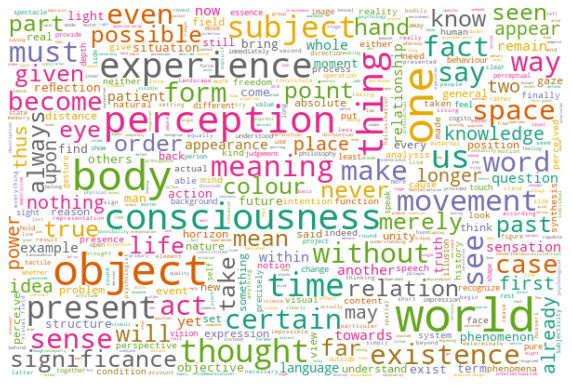

Author =  HEIDEGGER :


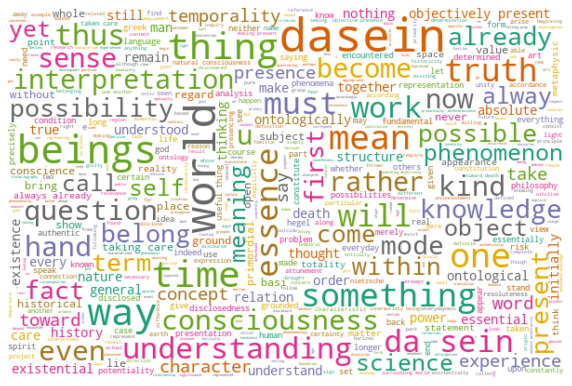

Author =  HUSSERL :


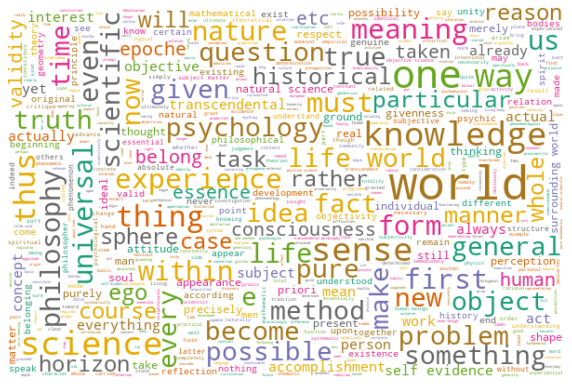

In [45]:
stopwords = set(STOPWORDS)
author = ["Merleau-Ponty", "Heidegger", "Husserl"]

for au in author:
    data_temp3 = data[data.author == au]  
    print('Author = ', au.upper(), ':')   
    # render wordcloud
    text = " ".join(txt for txt in data_temp3.sentence_lowered)
    wordcloud = WordCloud(stopwords=stopwords, max_font_size=50, max_words=500,
                          width = 600, height = 400, colormap="Dark2",
                          background_color="white").generate(text)
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

Merleau-Ponty's most frequently used words are "consciousness", "experience", "meaning", "perception", etc. Heidegger's frequently used words are "mean", "understanding", "sense", etc. Husserl's frequently used words are "meaning", "knowledge", "sense".
Also the topics of the three authors' works are similar, and their school phenomenology's high-frequency words including "consciousness", "meaning", "experience", "thought" are around the same topic.

# Conclusion

- Through exploratory analysis, we can find that the sentence lengths of different schools, authors and works are different. Besides, authors generally have their own writing styles, for example, some like to write long sentences.

- Through the wordcloud visualization, we get the high-frequency words of each school, and even if we don’t know much about the schools and works belong to them, we can have sense ahout the main theory and idea of them. Then, through the comparison of wordcloud images, we can also find that there are case that commonly used words of several groups of opposing schools are similar, as well as different.

- In addition, by analyzing the authors within the school, it can be seen that the author's topics are basically consistent with the school to which he belongs.